# Оператор Собеля

In [4]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

In [2]:
img = cv2.imread('datas/lena.png')
img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

In [3]:
img.dtype

dtype('uint8')

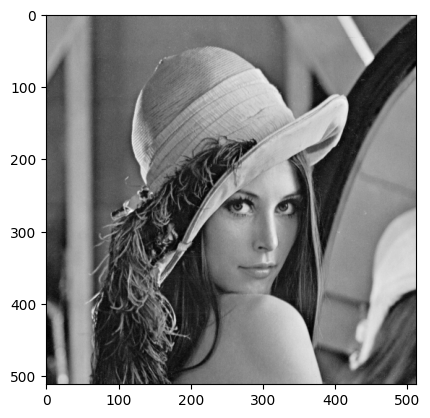

In [6]:
plt.imshow(img_gray, cmap='gray');

## Оператор Собеля для вычисления X и Y составляющих градиетна

In [9]:
sobel_x = np.array(
    [
        [-1, 0, 1],
        [-2, 0, 2],
        [-1, 0, 1]
    ]
)
sobel_x

array([[-1,  0,  1],
       [-2,  0,  2],
       [-1,  0,  1]])

In [10]:
sobel_y = np.array(
    [
        [-1, -2, -1],
        [0, 0, 0],
        [1, 2, 1]
    ]
)
sobel_y

array([[-1, -2, -1],
       [ 0,  0,  0],
       [ 1,  2,  1]])

## Вычисляем градиенты по осям

In [11]:
grad_x = cv2.filter2D(img_gray, cv2.CV_32F, sobel_x)
grad_y = cv2.filter2D(img_gray, cv2.CV_32F, sobel_y)

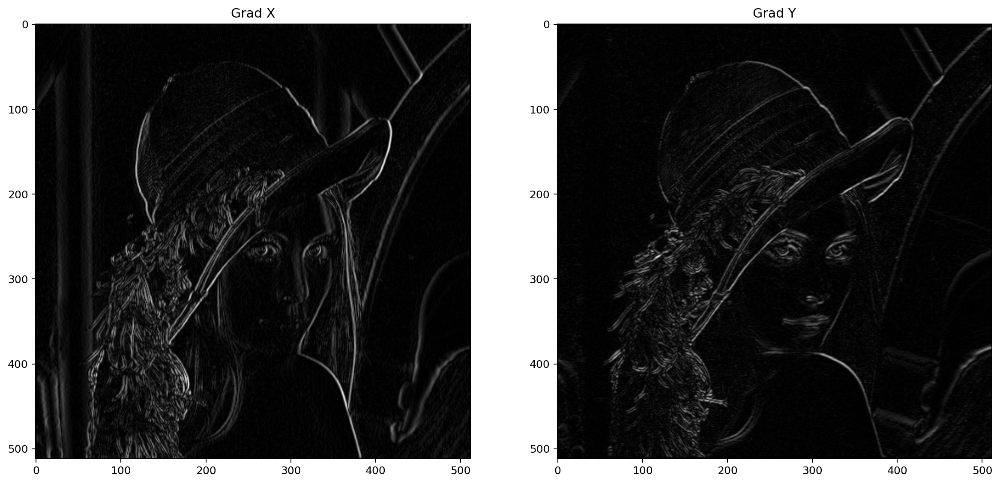

In [12]:
plt.figure(2, figsize=(16, 12), dpi=180)
plt.subplot(121)
plt.imshow(np.abs(grad_x)/np.max(np.abs(grad_x)), cmap='gray')
plt.title('Grad X')
plt.subplot(122)
plt.imshow(np.abs(grad_y)/np.max(np.abs(grad_y)), cmap='gray')
plt.title('Grad Y');

> Така как после применения оператора собеля матрица может содержать как положительные, так и отрицательные числа. А в изображении должны присутствовать только положительные числа. Поэтому используем для взуализации абсолютные значения чисел из матрицы, испльзуя `np.abs`

> После этого используем нормировку, разделив все значения матрицы на максимальное значение. После чего, значения стали в диапазоне от 0 до 1

Что получится, если не провести нормализацию?

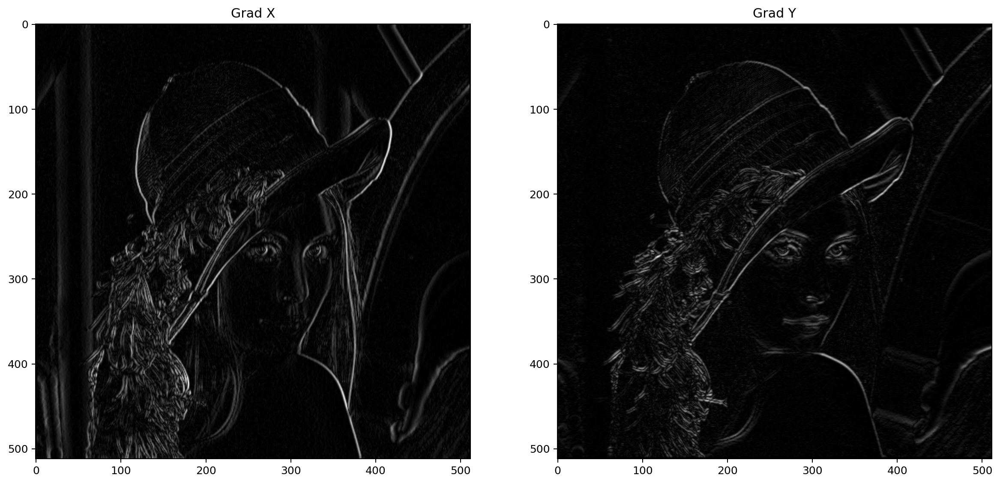

In [13]:
plt.figure(2, figsize=(16, 12), dpi=180)
plt.subplot(121)
plt.imshow(np.abs(grad_x), cmap='gray')
plt.title('Grad X')
plt.subplot(122)
plt.imshow(np.abs(grad_y), cmap='gray')
plt.title('Grad Y');

Что получится, если не брать значения по модулю и не нормализовать?

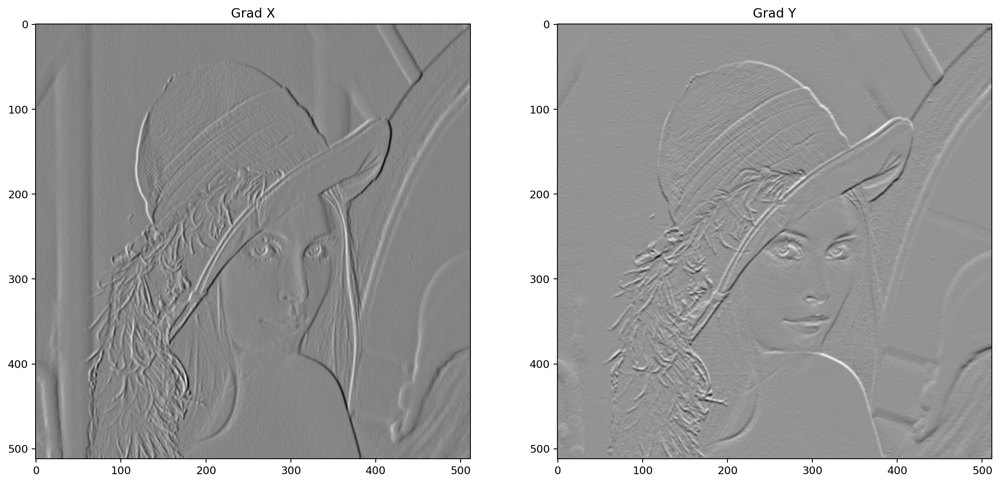

In [14]:
plt.figure(2, figsize=(16, 12), dpi=180)
plt.subplot(121)
plt.imshow(grad_x, cmap='gray')
plt.title('Grad X')
plt.subplot(122)
plt.imshow(grad_y, cmap='gray')
plt.title('Grad Y');

## Вычисляем суммарный градиент

In [16]:
grad = np.sqrt(grad_x**2 + grad_y**2)
theta = np.arctan2(grad_y, grad_x)

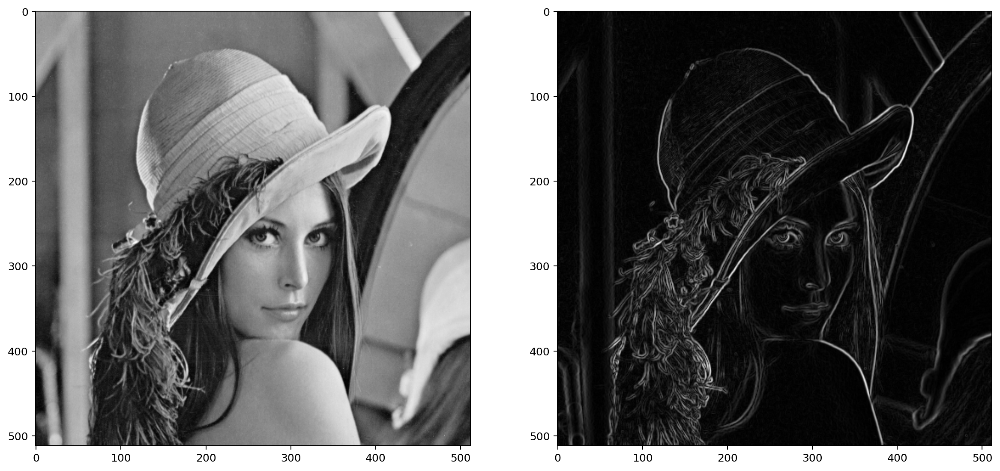

In [18]:
plt.figure(2, figsize=(16, 12), dpi=180)
plt.subplot(121)
plt.imshow(img_gray, cmap='gray')
plt.subplot(122)
plt.imshow(grad, cmap='gray');

## Визуализация направления градиента

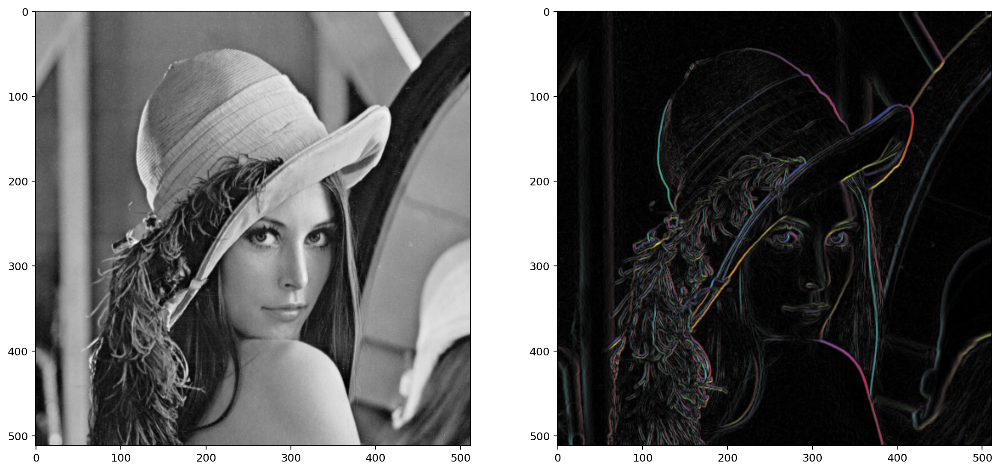

In [19]:
H = np.uint8((theta + np.pi) / (2 * np.pi) * 180)
S = np.uint8(grad / np.max(grad) * 255)
V = np.uint8(grad / np.max(grad) * 255)

theta_hsv = np.stack([H, S, V], axis=-1)
theta_rgb = cv2.cvtColor(theta_hsv, cv2.COLOR_HSV2RGB)

plt.figure(2, figsize=(16, 12), dpi=180)
plt.subplot(121)
plt.imshow(img_gray, cmap='gray')
plt.subplot(122)
plt.imshow(theta_rgb, cmap='gray');